In [1]:
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import cv2

In [2]:
def get_hsv_rgb(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    b, g, r = cv2.split(img)
    return h, s, v, r, g, b

In [3]:
# Ekualisasi histogram manual untuk channel V (grayscale 0-255)
def equalize_hist_manual(channel):
    hist, bins = np.histogram(channel.flatten(), 256, [0,256])
    cdf = hist.cumsum()
    cdf_mask = cdf != 0  # Avoid div by zero
    cdf_min = cdf[cdf_mask].min()
    cdf_max = cdf[cdf_mask].max()

    cdf_normalized = (cdf - cdf_min) * 255 / (cdf_max - cdf_min)
    cdf_normalized = np.clip(cdf_normalized, 0, 255).astype(np.uint8)

    equalized = cdf_normalized[channel]
    return equalized

In [4]:
# Segmentasi serviks manual sesuai rule
def segment_serviks_manual(img):
    hasil = np.zeros(img.shape[:2], dtype=np.uint8)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hue, sat, val = cv2.split(hsv)
    red, green, blue = cv2.split(img)

    sat_f = sat.astype(np.float32) / 255.0
    val_f = val.astype(np.float32) / 255.0

    mask = (~((red > 238) & (green > 238) & (blue > 238))) & \
           (((hue < 10) | (hue > 160)) & ~((sat_f < 0.2) & (val_f < 0.95))) & \
           (val_f > 0.15)

    hasil[mask] = 255
    return hasil

In [16]:
# Segmentasi lesi manual berdasarkan klaster
def segment_lesi_manual(img, cluster_id):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hue, sat, val = cv2.split(hsv)
    hue = hue.astype(np.float32) * 2  
    
    if cluster_id == 0:
        mask1 = (hue >= 290) & (hue <= 360) & (sat>= 20) & (sat<= 100) & (val >= 180) & (val<= 240)
        mask2 = (hue >= 0) & (hue<= 100) & (sat>= 0) & (sat<= 80) & (val >= 250) & (val<= 255)
        mask = mask1 | mask2
    elif cluster_id == 1:
        mask1 = (hue >= 290) & (hue <= 360) & (sat>= 20) & (sat<= 70) & (val>= 220) & (val<= 250)
        mask2 = (hue >= 0) & (hue <= 100) & (sat >= 0) & (sat <= 40) & (val >= 250) & (val <= 255)
        mask = mask1 | mask2
    elif cluster_id == 2:
        mask1 = (hue >= 290) & (hue <= 360) & (sat>= 70) & (sat<= 110) & (val>= 190) & (val<= 255)
        mask2 = (hue >= 0) & (hue <= 100) & (sat >= 0) & (sat <= 80) & (val >= 250) & (val <= 255)
        mask = mask1 | mask2
    else:
        mask1 = (hue >= 290) & (hue <= 360) & (sat>= 20) & (sat<= 100) & (val>= 180) & (val<= 255)
        mask2 = (hue >= 0) & (hue <= 50) & (sat >= 0) & (sat <= 130) & (val >= 240) & (val <= 255)
        mask = mask1 | mask2

    return (mask.astype(np.uint8) * 255)

In [6]:
# Path dan ambil gambar
folder_path = "C:\\Users\\LENOVO\\OneDrive - unesa.ac.id\\SEMESTER 4\\PCD\\Project\\Colposcopy dataset\\After acetic acid"
image_paths = glob(os.path.join(folder_path, "*.jpg"))

mean_colors = []
serviks_masks = []
images = []
images_eq = []
filenames = []

for path in image_paths:
    img = plt.imread(path)  # plt.imread otomatis load RGB float 0-1
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)

    img = img[:, :, ::-1] 
    images.append(img)
    filenames.append(os.path.basename(path))

    # Convert ke HSV manual
    HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(HSV)

    # Equalisasi V manual
    V_eq = equalize_hist_manual(V)

    # Konversi HSV ke BGR untuk hasil ekualisasi
    hsv_eq = cv2.merge([H, S, V_eq])
    img_eq = cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2BGR)
    images_eq.append(img_eq)

    mask_serviks = segment_serviks_manual(img_eq)
    serviks_masks.append(mask_serviks)

    hsv_eq = cv2.cvtColor(img_eq, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_eq)
    mask = mask_serviks > 0
    mean_colors.append([np.mean(h[mask]), np.mean(s[mask]), np.mean(v[mask])])

In [7]:
# Clustering
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(mean_colors)

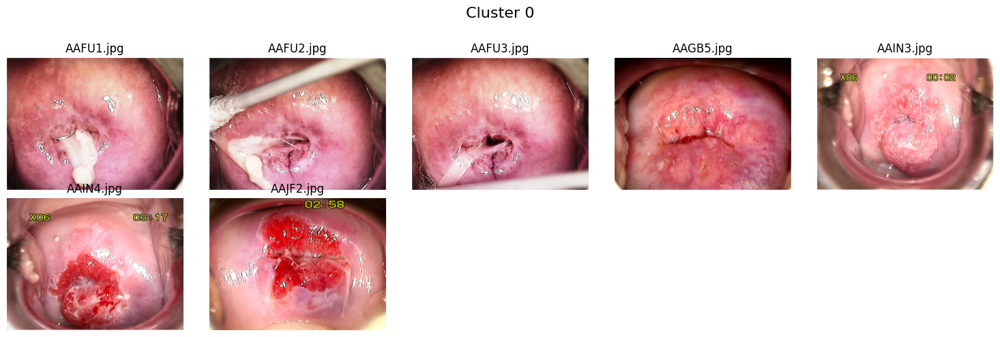

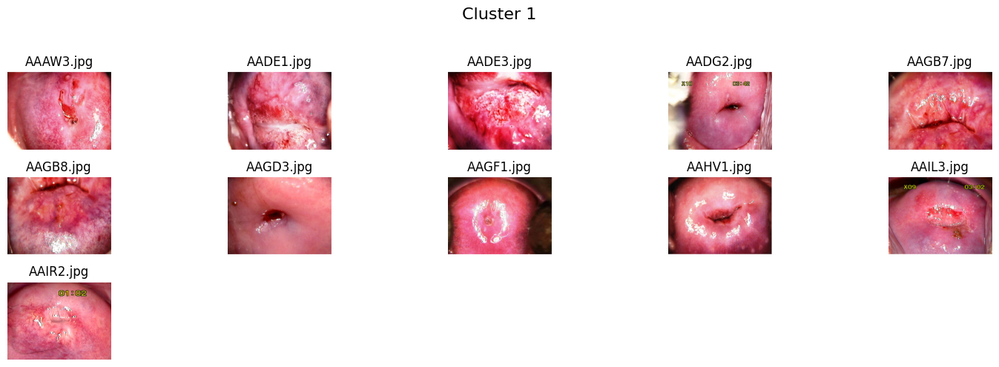

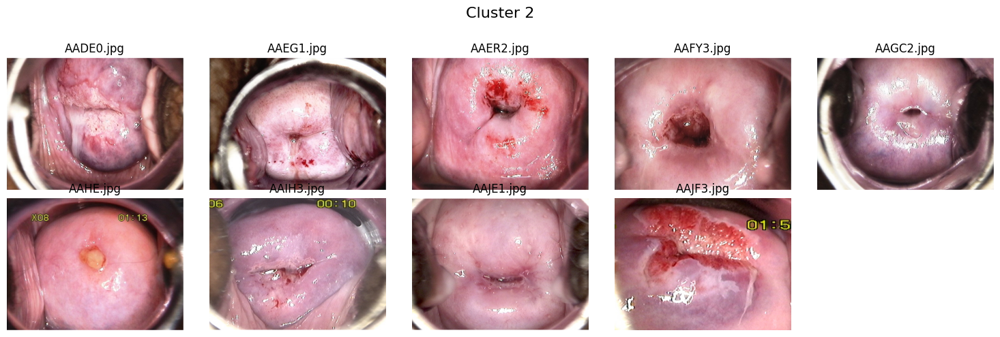

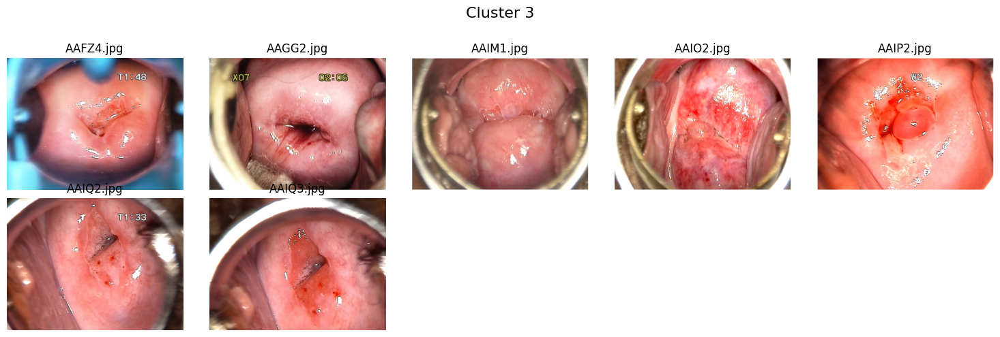

In [8]:
cluster_0 = []
cluster_1 = []
cluster_2 = []
cluster_3 = []

for i, cluster_id in enumerate(clusters):
    if cluster_id == 0:
        cluster_0.append(i)
    elif cluster_id == 1:
        cluster_1.append(i)
    elif cluster_id == 2:
        cluster_2.append(i)
    else:
        cluster_3.append(i)

def tampilkan_cluster(indices, title):
    plt.figure(figsize=(15, 5))
    plt.suptitle(title, fontsize=16)
    n = len(indices)
    cols = 5
    rows = (n + cols - 1) // cols
    for idx, i in enumerate(indices):
        ori_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(ori_rgb)
        plt.title(f"{filenames[i]}")
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

tampilkan_cluster(cluster_0, "Cluster 0")
tampilkan_cluster(cluster_1, "Cluster 1")
tampilkan_cluster(cluster_2, "Cluster 2")
tampilkan_cluster(cluster_3, "Cluster 3")

In [9]:
def bitwise_and_manual(mask1, mask2):
    return ((mask1 > 0) & (mask2 > 0)).astype(np.uint8) * 255

In [10]:
def hitung_persen_area_lesi(mask_lesi_di_serviks, mask_serviks):
    # Hitung jumlah piksel untuk masing-masing mask
    total_serviks = np.sum(mask_serviks > 0)
    total_lesi = np.sum(mask_lesi_di_serviks > 0)

    if total_serviks == 0:
        return 0.0  # untuk menghindari pembagian nol

    persen_area = (total_lesi / total_serviks) * 100.0
    return persen_area


AAAW3.jpg | Cluster: 1 | Luas lesi = 1.85% dari area serviks


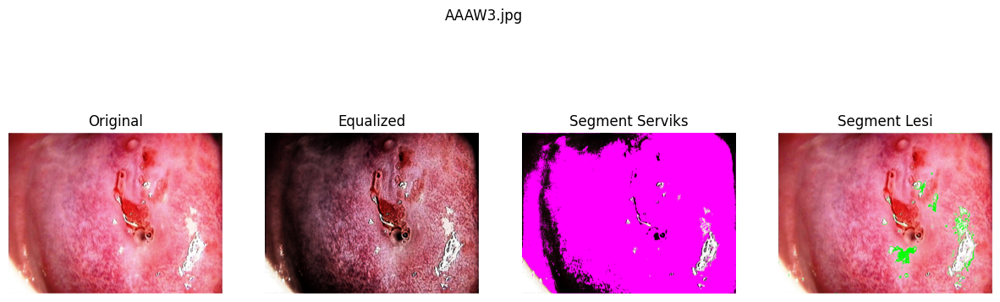

AADE0.jpg | Cluster: 2 | Luas lesi = 28.23% dari area serviks


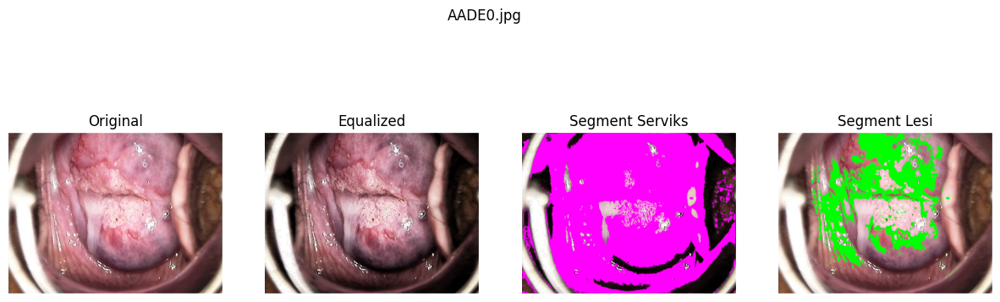

AADE1.jpg | Cluster: 1 | Luas lesi = 5.05% dari area serviks


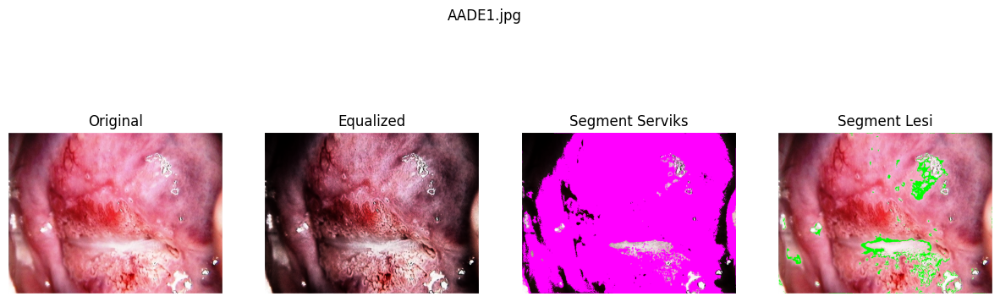

AADE3.jpg | Cluster: 1 | Luas lesi = 2.12% dari area serviks


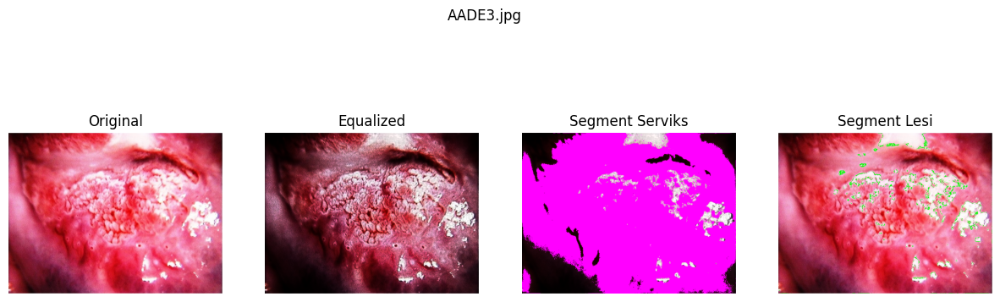

AADG2.jpg | Cluster: 1 | Luas lesi = 1.75% dari area serviks


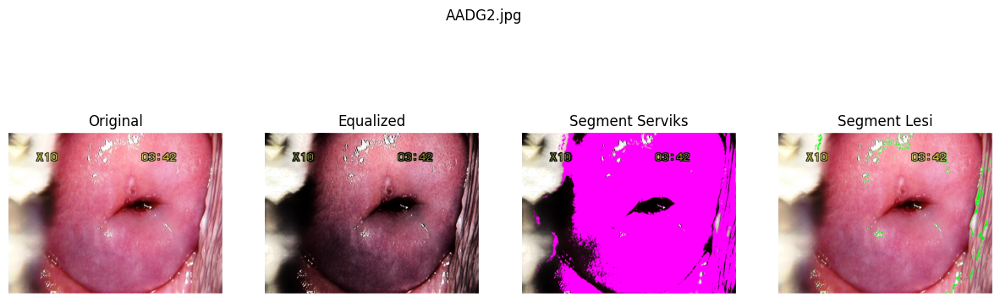

AAEG1.jpg | Cluster: 2 | Luas lesi = 12.02% dari area serviks


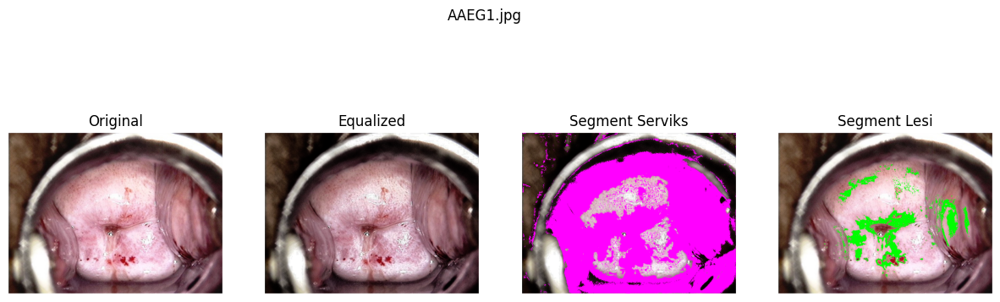

AAER2.jpg | Cluster: 2 | Luas lesi = 47.14% dari area serviks


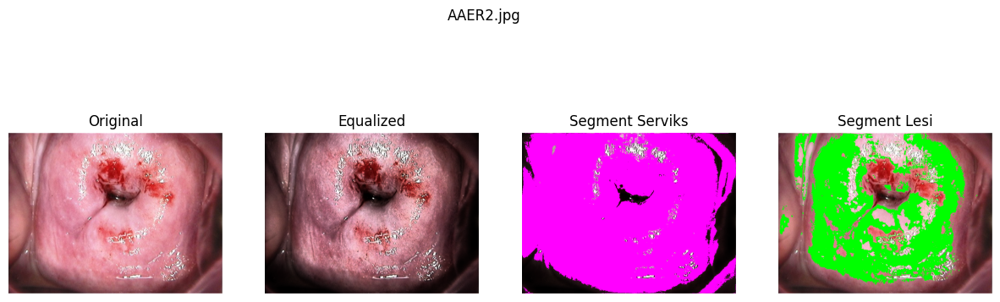

AAFU1.jpg | Cluster: 0 | Luas lesi = 24.58% dari area serviks


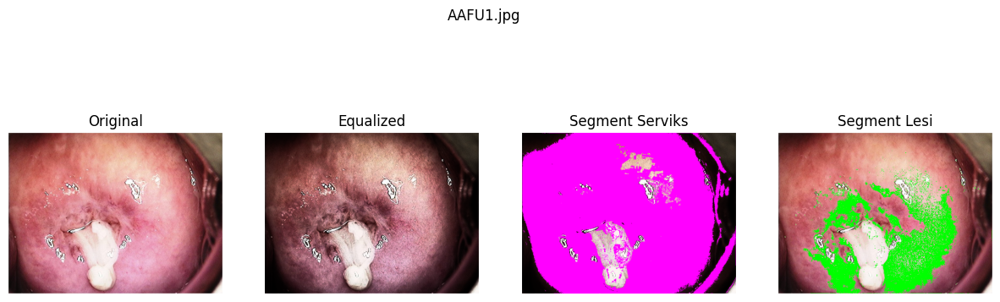

AAFU2.jpg | Cluster: 0 | Luas lesi = 27.56% dari area serviks


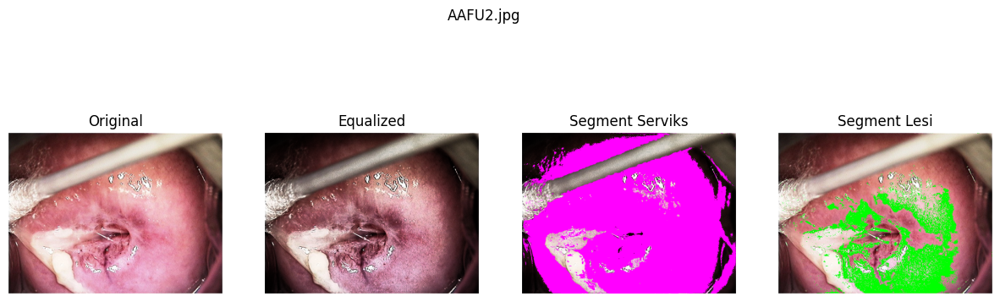

AAFU3.jpg | Cluster: 0 | Luas lesi = 20.34% dari area serviks


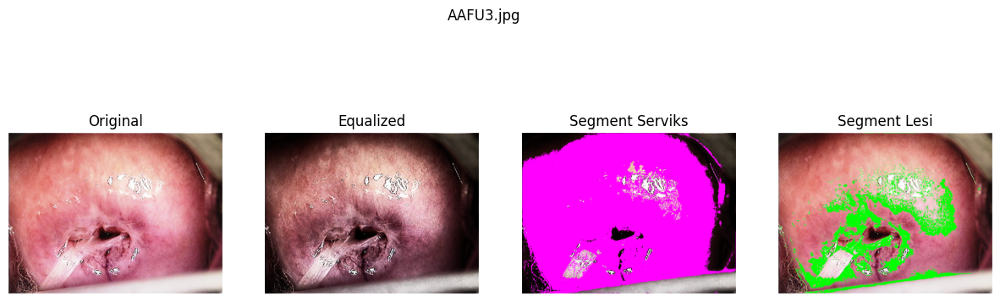

AAFY3.jpg | Cluster: 2 | Luas lesi = 25.37% dari area serviks


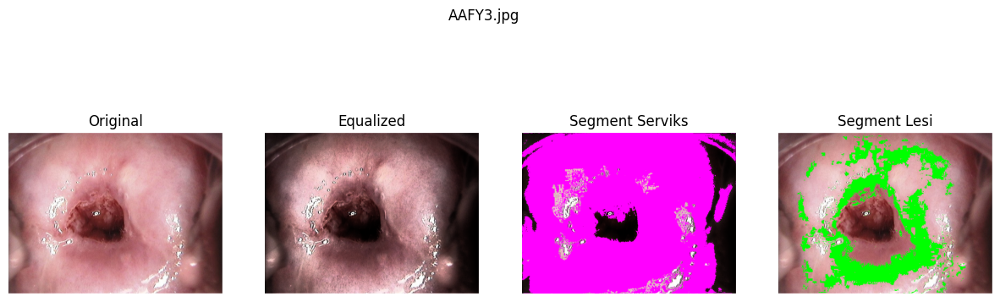

AAFZ4.jpg | Cluster: 3 | Luas lesi = 28.30% dari area serviks


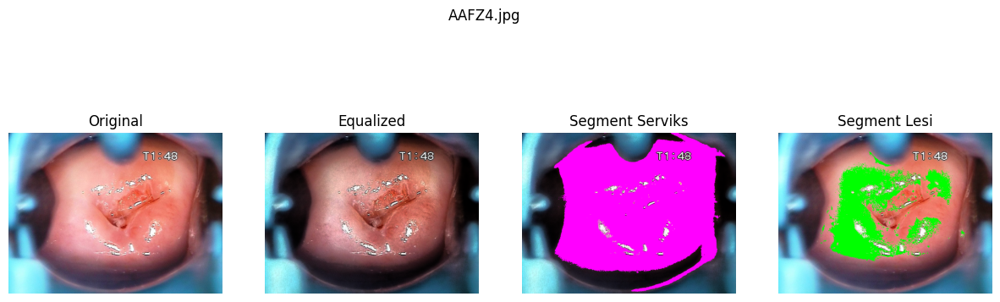

AAGB5.jpg | Cluster: 0 | Luas lesi = 3.44% dari area serviks


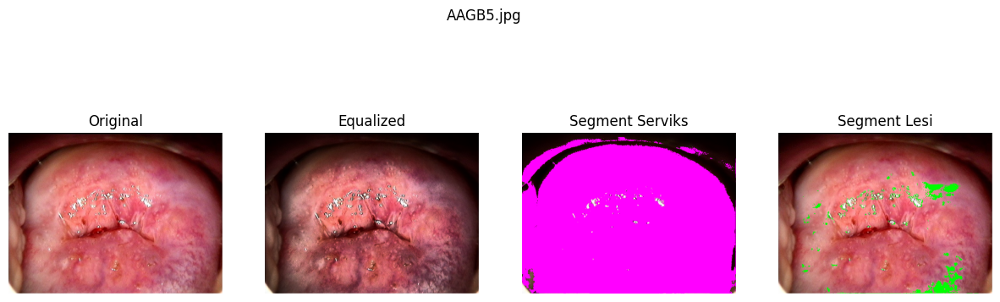

AAGB7.jpg | Cluster: 1 | Luas lesi = 0.69% dari area serviks


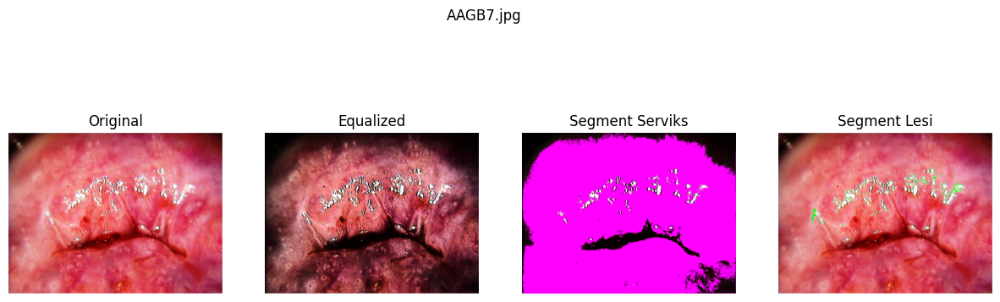

AAGB8.jpg | Cluster: 1 | Luas lesi = 2.03% dari area serviks


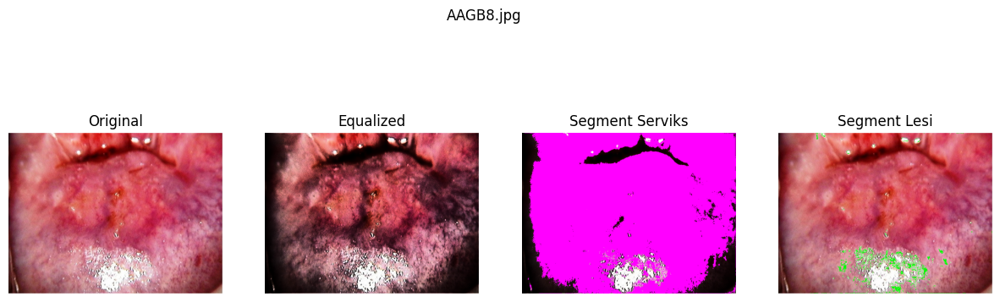

AAGC2.jpg | Cluster: 2 | Luas lesi = 6.03% dari area serviks


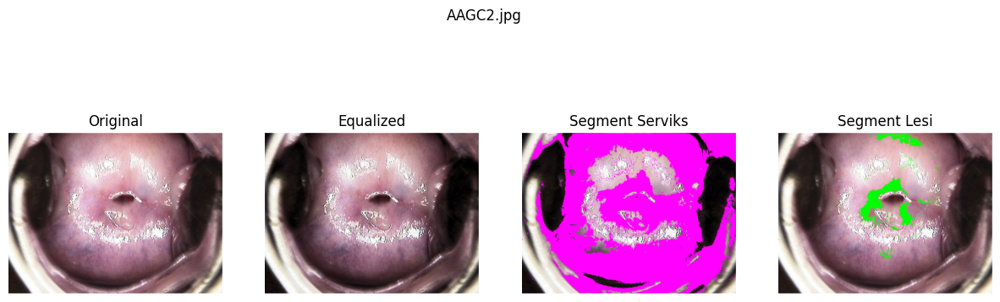

AAGD3.jpg | Cluster: 1 | Luas lesi = 0.41% dari area serviks


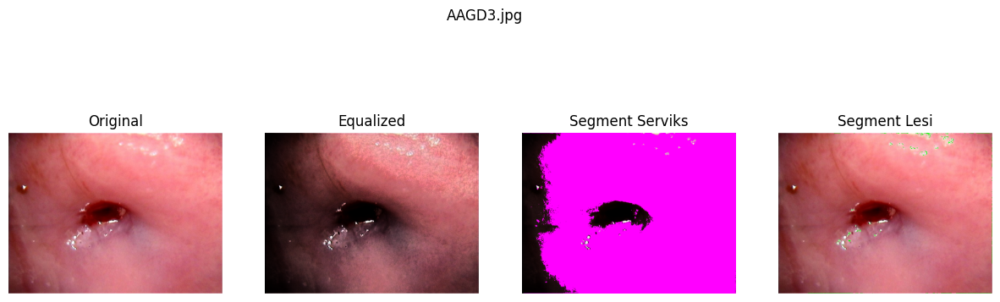

AAGF1.jpg | Cluster: 1 | Luas lesi = 1.49% dari area serviks


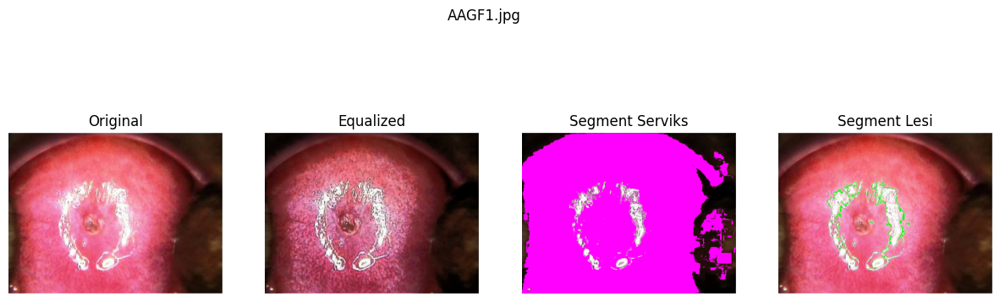

AAGG2.jpg | Cluster: 3 | Luas lesi = 20.82% dari area serviks


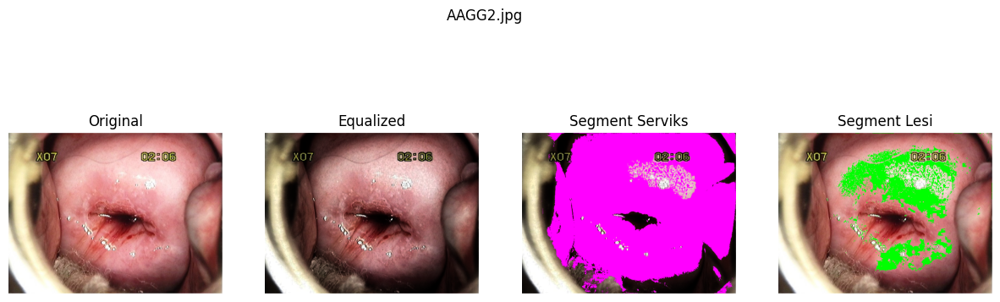

AAHE.jpg | Cluster: 2 | Luas lesi = 35.61% dari area serviks


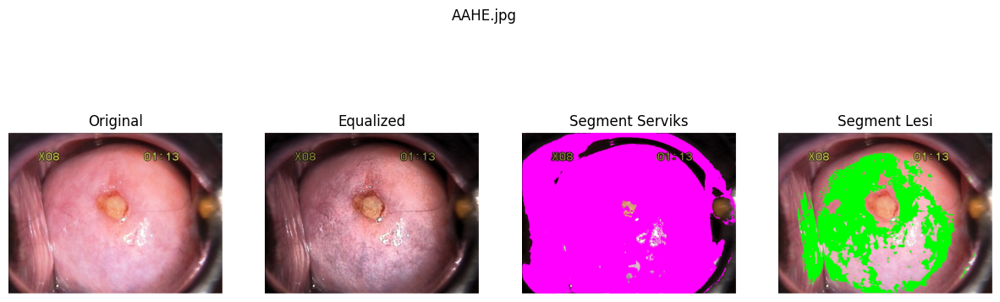

AAHV1.jpg | Cluster: 1 | Luas lesi = 4.50% dari area serviks


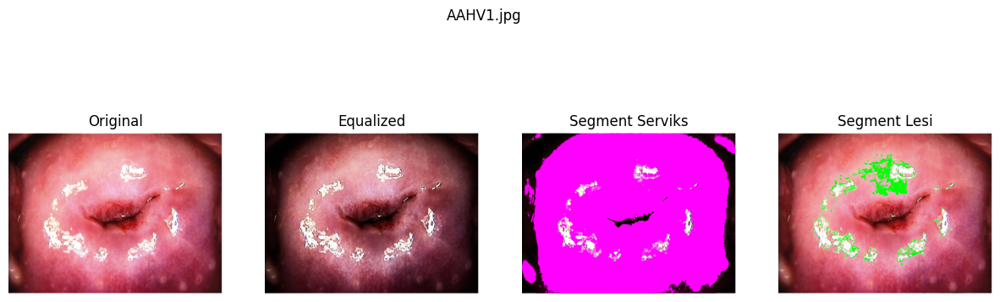

AAIH3.jpg | Cluster: 2 | Luas lesi = 25.86% dari area serviks


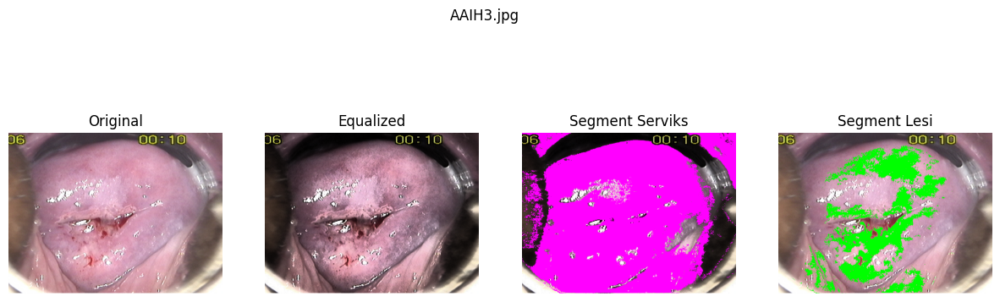

AAIL3.jpg | Cluster: 1 | Luas lesi = 0.30% dari area serviks


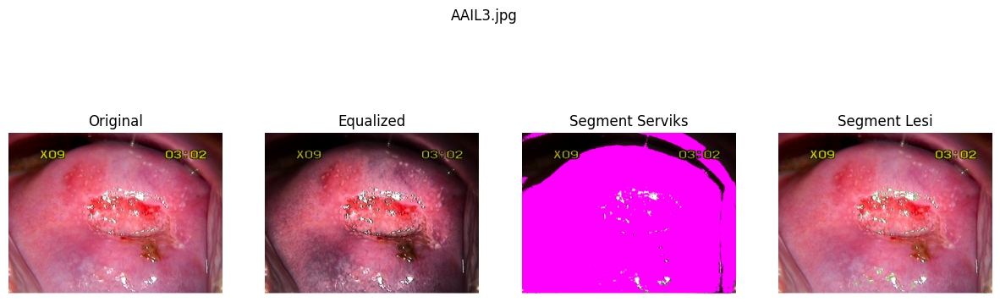

AAIM1.jpg | Cluster: 3 | Luas lesi = 9.70% dari area serviks


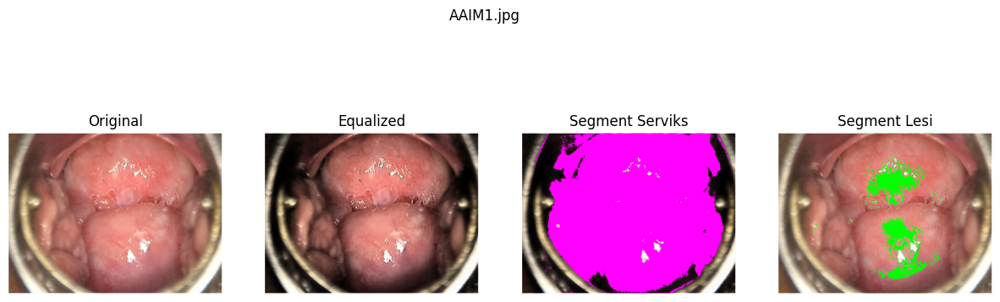

AAIN3.jpg | Cluster: 0 | Luas lesi = 13.83% dari area serviks


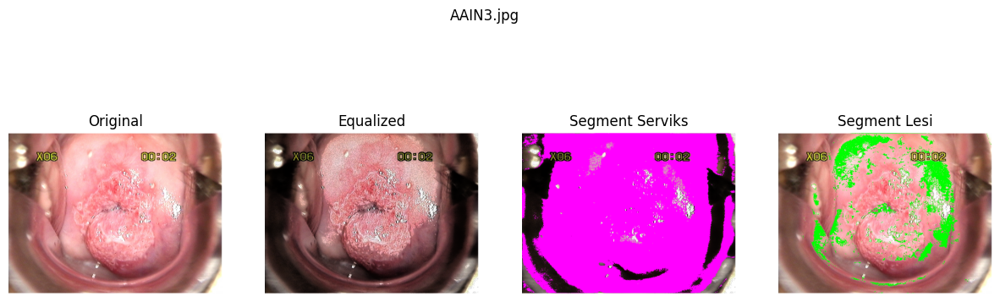

AAIN4.jpg | Cluster: 0 | Luas lesi = 12.62% dari area serviks


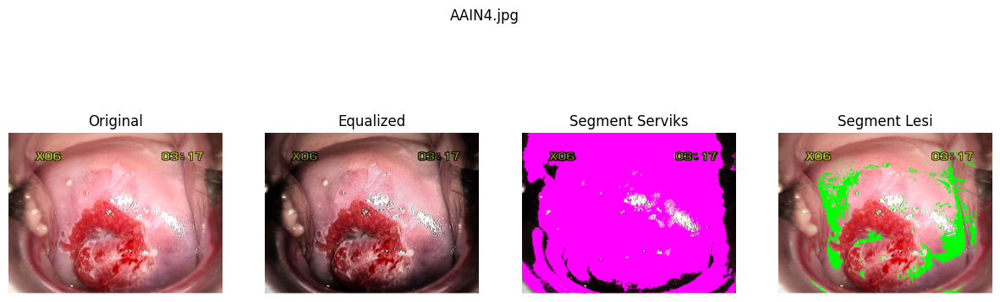

AAIO2.jpg | Cluster: 3 | Luas lesi = 21.03% dari area serviks


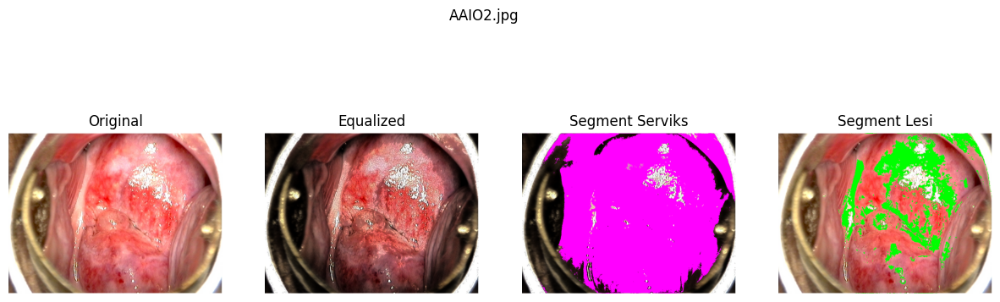

AAIP2.jpg | Cluster: 3 | Luas lesi = 38.33% dari area serviks


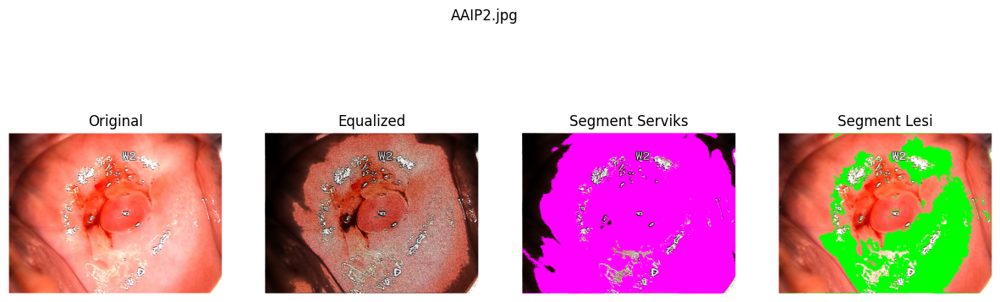

AAIQ2.jpg | Cluster: 3 | Luas lesi = 24.84% dari area serviks


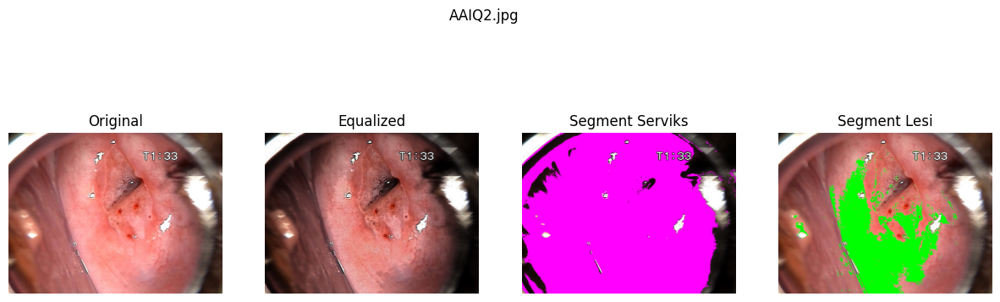

AAIQ3.jpg | Cluster: 3 | Luas lesi = 23.46% dari area serviks


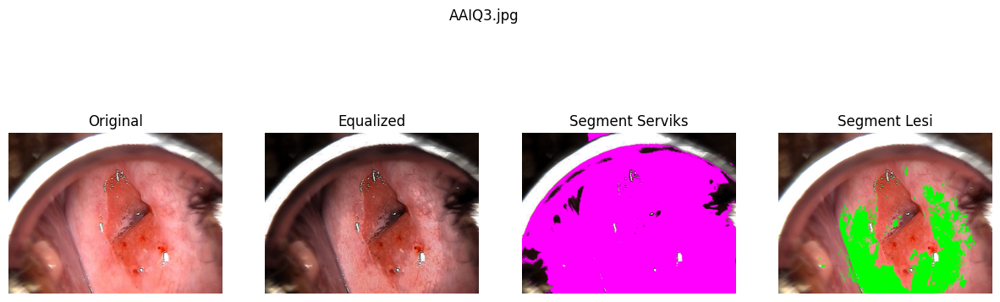

AAIR2.jpg | Cluster: 1 | Luas lesi = 0.25% dari area serviks


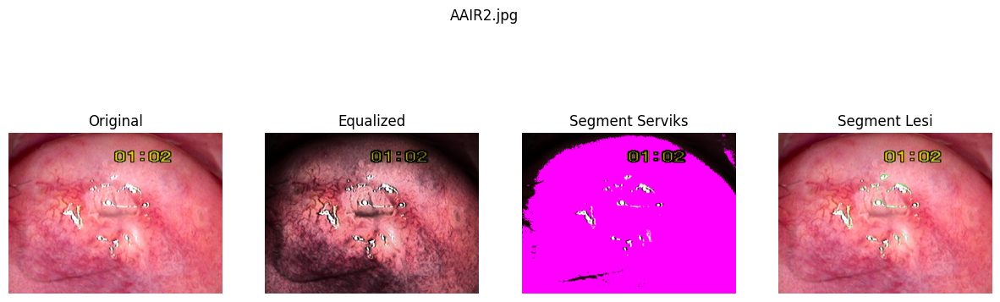

AAJE1.jpg | Cluster: 2 | Luas lesi = 16.20% dari area serviks


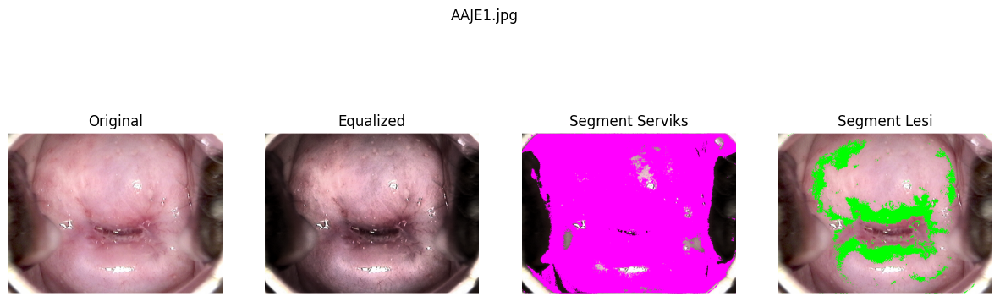

AAJF2.jpg | Cluster: 0 | Luas lesi = 12.69% dari area serviks


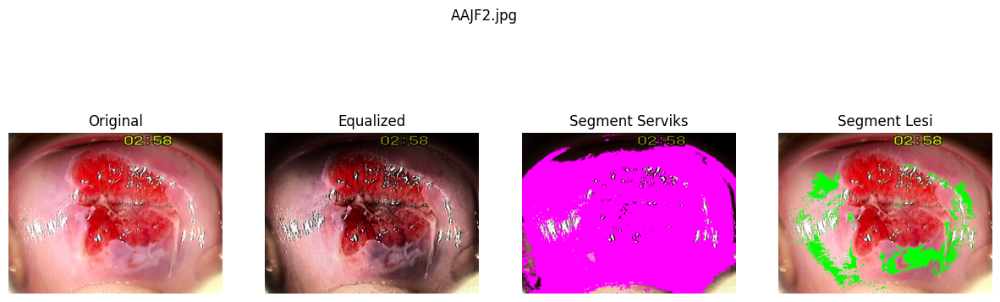

AAJF3.jpg | Cluster: 2 | Luas lesi = 28.87% dari area serviks


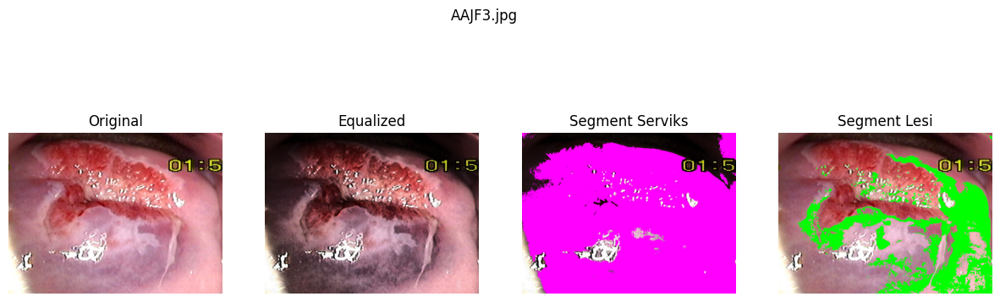

In [17]:
# Tampilkan hasil
for i, (ori, eq, mask, fname, cluster_id) in enumerate(zip(images, images_eq, serviks_masks, filenames, clusters)):
    
    lesi_mask = segment_lesi_manual(ori, cluster_id)
    lesi_mask_area_serviks = bitwise_and_manual(lesi_mask, mask)
    persen = hitung_persen_area_lesi(lesi_mask_area_serviks, mask)
    print(f"{fname} | Cluster: {cluster_id} | Luas lesi = {persen:.2f}% dari area serviks")


    serviks_overlay = eq.copy()
    serviks_overlay[mask > 0] = [255, 0, 255]

    lesi_overlay = ori.copy()
    lesi_overlay[lesi_mask_area_serviks > 0] = [0, 255, 0]

    ori_rgb = ori[:, :, ::-1]
    eq_rgb = eq[:, :, ::-1]
    serviks_rgb = serviks_overlay[:, :, ::-1]
    lesi_rgb = lesi_overlay[:, :, ::-1]

    fig, ax = plt.subplots(1, 4, figsize=(15, 5))
    ax[0].imshow(ori_rgb)
    ax[0].set_title("Original")
    ax[0].axis('off')
    ax[1].imshow(eq_rgb)
    ax[1].set_title("Equalized")
    ax[1].axis('off')
    ax[2].imshow(serviks_rgb)
    ax[2].set_title("Segment Serviks")
    ax[2].axis('off')
    ax[3].imshow(lesi_rgb)
    ax[3].set_title("Segment Lesi")
    ax[3].axis('off')
    plt.suptitle(fname)
    plt.show()
